In [52]:
import os
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad

import matplotlib.pyplot as plt
import seaborn as sns

In [53]:
import pysodb

In [54]:
sc.set_figure_params(vector_friendly=False,format='pdf',transparent=True,dpi=50)
plt.rcParams["figure.figsize"] = (8, 8)

sns.set_style('white')

### load data using pysodb

In [55]:
sodb = pysodb.SODB() # Initialization



/home/yzy/anaconda3/envs/SODB/lib/python3.9/site-packages/urllib3-1.26.12-py3.9.egg/urllib3/connectionpool.py:1045: InsecureRequestWarning: Unverified HTTPS request is being made to host 'gene.ai.tencent.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


In [ ]:
# this dataset is from publication "Dissecting the treatment-naive ecosystem of human melanoma brain metastasis"

In [ ]:
# link in SODB: https://gene.ai.tencent.com/SpatialOmics/dataset?datasetID=119

In [58]:
adata = sodb.load_experiment('Biermann2022Dissecting','GSM6025950_ECM10')


load experiment[GSM6025950_ECM10] in dataset[Biermann2022Dissecting] from /home/yzy/anaconda3/envs/SODB/lib/python3.9/site-packages/pysodb-1.0.0-py3.9.egg/pysodb/cache/Biermann2022Dissecting/GSM6025950_ECM10.h5ad


### play with SCANPY


#### identify clusters

In [59]:
# sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=200)

In [60]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

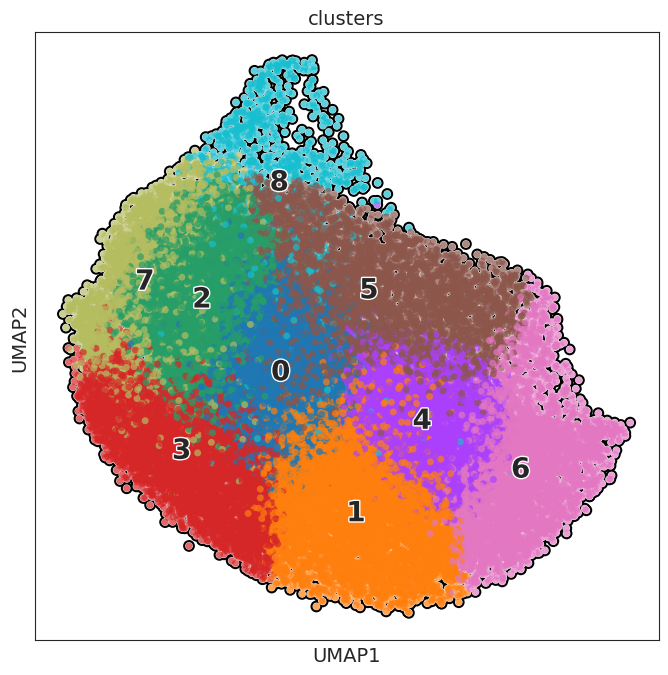

In [67]:
sc.pl.umap(adata, color=[ "clusters"], wspace=0.4,
          add_outline=True,legend_fontsize=20, legend_fontoutline=2,
            legend_loc='on data',
            s=100
          )

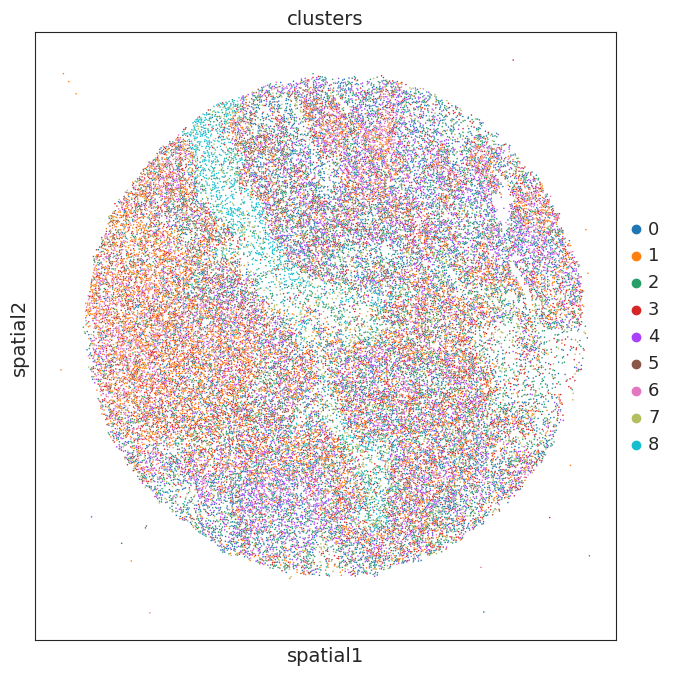

In [62]:
# plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.embedding(adata, basis='spatial', color=['clusters'],show=False,size=5,add_outline=False)
plt.gca().set_aspect('equal', adjustable='box')

#### marker gene detection

/home/yzy/anaconda3/envs/SODB/lib/python3.9/site-packages/scanpy-1.9.1-py3.9.egg/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


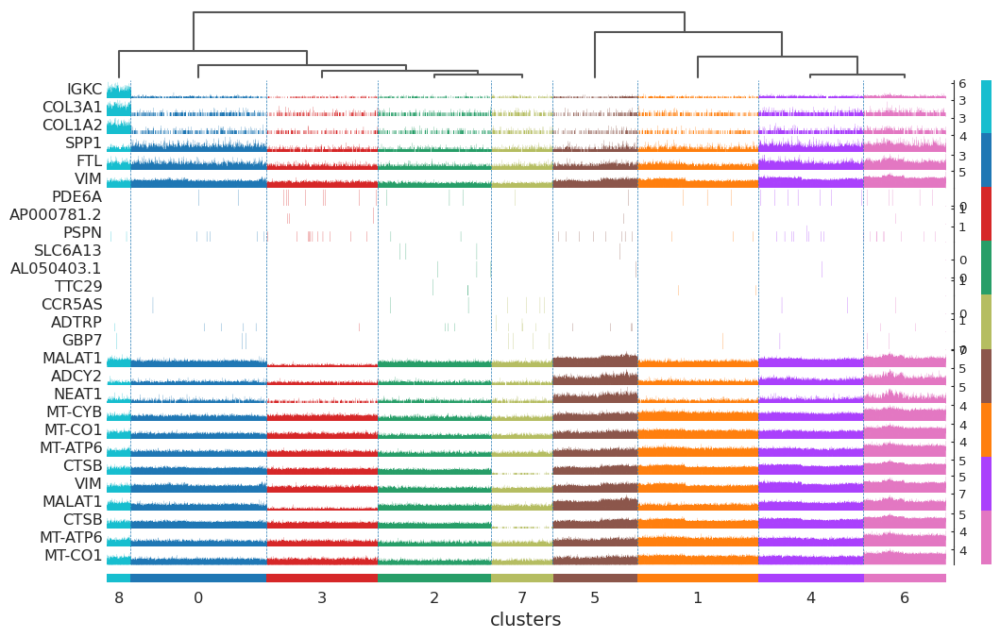

In [63]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_tracksplot(adata, n_genes=3, groupby="clusters")

In [64]:
marker_genes = adata.uns['rank_genes_groups']['names'][0]

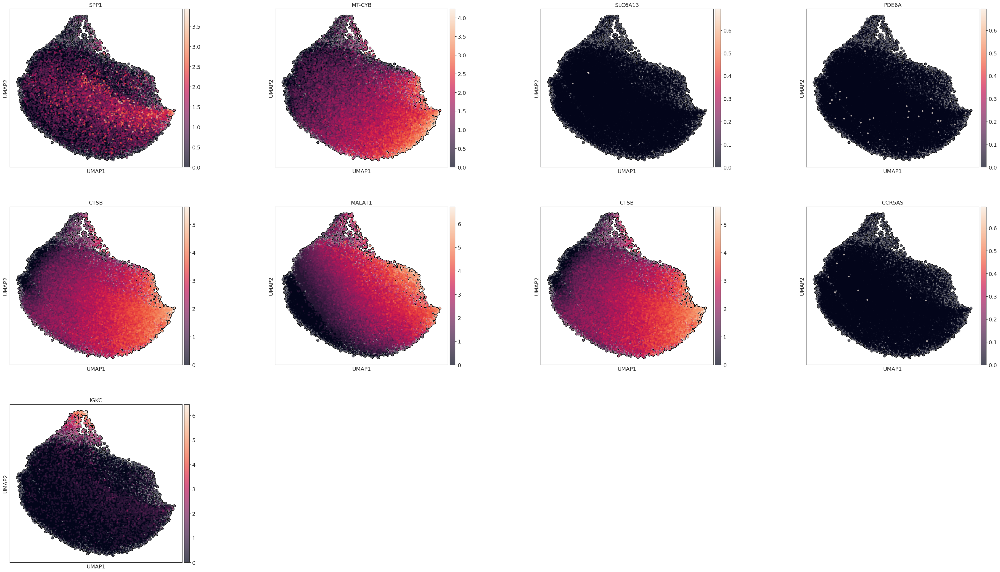

In [65]:
sc.pl.umap(adata, color=marker_genes, wspace=0.4,
          add_outline=True,legend_fontsize=10, legend_fontoutline=2,
            legend_loc='on data',
            s=80
          )

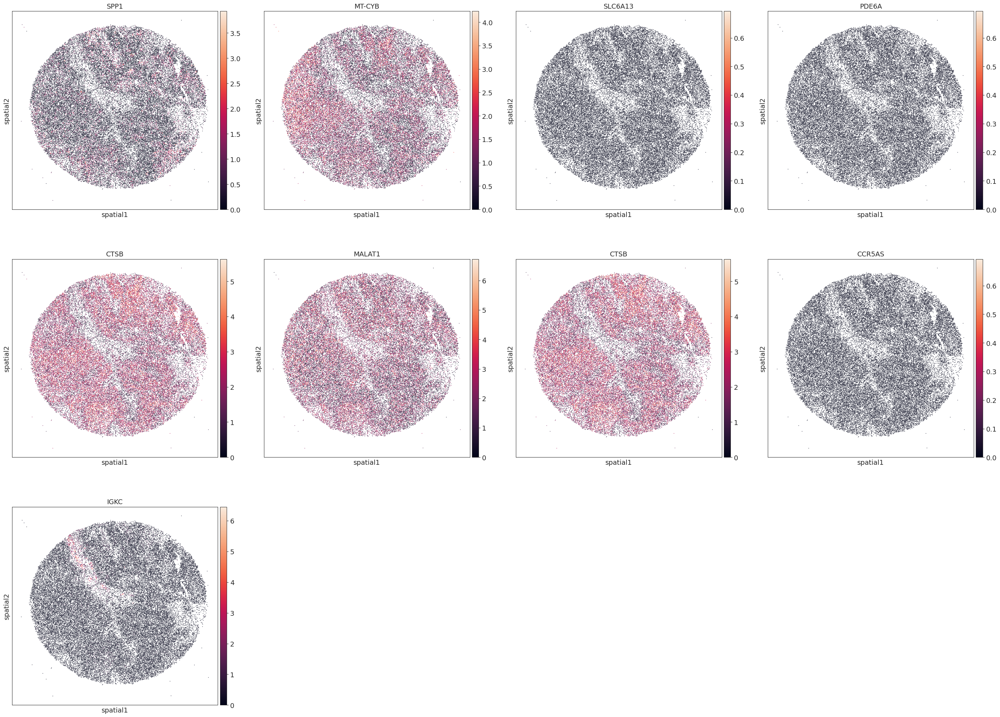

In [66]:
# plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.embedding(adata, basis='spatial', color=marker_genes,size=5,add_outline=False)
